# **Business Case: Ninjacart - CV Classification**

### **About Business:**

*Ninjacart is India's largest fresh produce supply chain company. They are pioneers in solving one of the toughest supply chain problems of the world by leveraging innovative technology. They source fresh produce from farmers and deliver them to businesses within 12 hours. An integral component of their automation process is the development of robust classifiers which can distinguish between images of different types of vegetables, while also correctly labeling images that do not contain any one type of vegetable as noise.*

### **Problem Statement:**

*As a starting point, Ninjacart has provided us with a dataset scraped from the web which contains train and test folders, each having 4 sub-folders with images of onions, potatoes, tomatoes and some market scenes. We have been tasked with preparing a multiclass classifier for identifying these vegetables. The dataset provided has all the required images to achieve the task.*

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip /content/drive/MyDrive/ninjacart_data.zip

Archive:  /content/drive/MyDrive/ninjacart_data.zip
   creating: ninjacart_data/test/
   creating: ninjacart_data/test/indian market/
  inflating: ninjacart_data/test/indian market/bhl.jpeg  
  inflating: ninjacart_data/test/indian market/bhv.jpeg  
  inflating: ninjacart_data/test/indian market/bn.jpeg  
  inflating: ninjacart_data/test/indian market/hjx.jpeg  
  inflating: ninjacart_data/test/indian market/igis.jpeg  
  inflating: ninjacart_data/test/indian market/in.jpeg  
  inflating: ninjacart_data/test/indian market/india-4898453__340.jpg  
  inflating: ninjacart_data/test/indian market/indianmarket10.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket12.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket13.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket14.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket15.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket18.jpeg  
  inflating: ninjacart_data/test/

In [3]:
import os
import glob
import random
import numpy as np
import pandas as pd
import sklearn.metrics as metrics
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Import tensorflow and its modules
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Sequential
from tensorflow.keras import callbacks
tf.keras.utils.set_random_seed(111) # set random seed

# To supress any warnings during the flow
import warnings
warnings.filterwarnings('ignore')

### **Checking the characteristics of the data:**

**Lets see how our image data looks like.**

In [4]:
class_dirs = os.listdir("ninjacart_data/train") # list all directories inside "train" folder
image_dict = {} # dict to store image array(key) for every class(value)
count_dict = {} # dict to store count of files(key) for every class(value)
# iterate over all class_dirs
for cls in class_dirs:
    # get list of all paths inside the subdirectory
    file_paths = glob.glob(f'ninjacart_data/train/{cls}/*')
    # count number of files in each c lass and add it to count_dict
    count_dict[cls] = len(file_paths)
    # select random item from list of image paths
    image_path = random.choice(file_paths)
    # load image using keras utility function and save it in image_dict
    image_dict[cls] = tf.keras.utils.load_img(image_path)

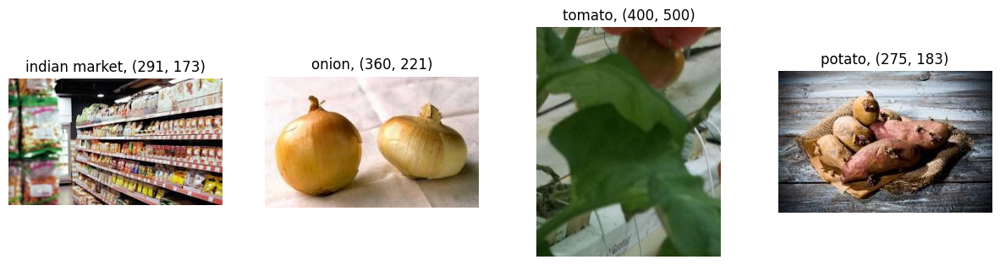

In [5]:
## Viz Random Sample from each class

plt.figure(figsize=(15, 12))
# iterate over dictionary items (class label, image array)
for i, (cls,img) in enumerate(image_dict.items()):
    # create a subplot axis
    ax = plt.subplot(3, 4, i + 1)
    # plot each image
    plt.imshow(img)
    # set "class name" along with "image size" as title
    plt.title(f'{cls}, {img.size}')
    plt.axis("off")

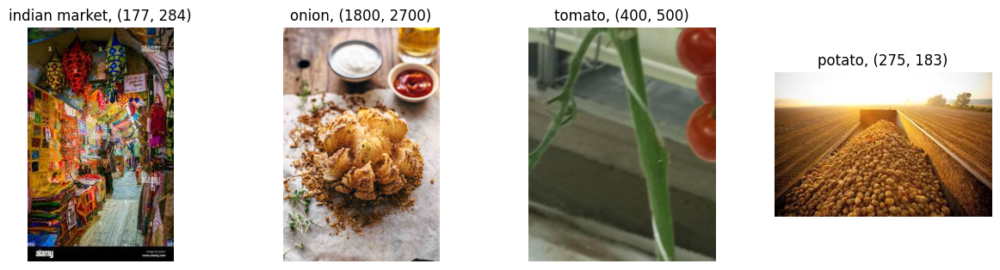

In [6]:
class_dirs_test = os.listdir("ninjacart_data/test") # list all directories inside "train" folder
image_dict_test = {} # dict to store image array(key) for every class(value)
count_dict_test = {} # dict to store count of files(key) for every class(value)
# iterate over all class_dirs
for cls in class_dirs_test:
    # get list of all paths inside the subdirectory
    file_paths = glob.glob(f'ninjacart_data/test/{cls}/*')
    # count number of files in each c lass and add it to count_dict
    count_dict_test[cls] = len(file_paths)
    # select random item from list of image paths
    image_path = random.choice(file_paths)
    # load image using keras utility function and save it in image_dict
    image_dict_test[cls] = tf.keras.utils.load_img(image_path)

plt.figure(figsize=(15, 12))
# iterate over dictionary items (class label, image array)
for i, (cls,img) in enumerate(image_dict_test.items()):
    # create a subplot axis
    ax = plt.subplot(3, 4, i + 1)
    # plot each image
    plt.imshow(img)
    # set "class name" along with "image size" as title
    plt.title(f'{cls}, {img.size}')
    plt.axis("off")

Here in the above images we can see that all the images across all the classes are of different sizes, so before creating the model we aill have to resize the images to the same size.

Let's now Plot the Data Distribution of Training Data across Classes.

In [7]:
df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})
print("Count of training samples per class:\n", df_count_train)

Count of training samples per class:
            class  count
0  indian market    599
1          onion    849
2         tomato    789
3         potato    898


<Axes: title={'center': 'Training Data Count per class'}, xlabel='class'>

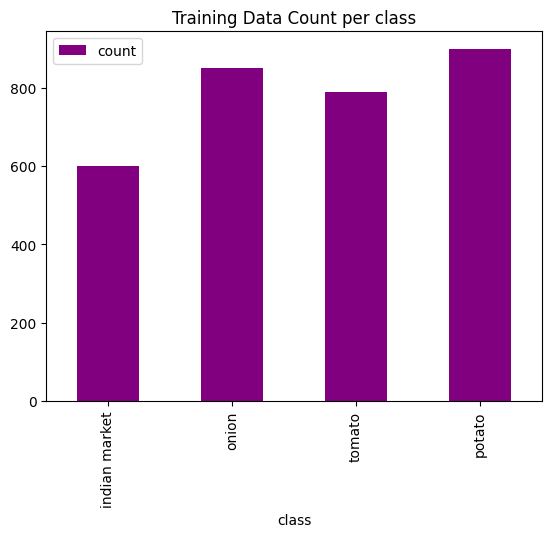

In [8]:
df_count_train.plot.bar(x='class', y='count', title="Training Data Count per class", color='purple')

From the above plots for train data we can see that the data is slightly imbalanced so in this case we will have to use techniques like Data(Image) Augmentation to make the data balanced cause if we send imbalanced data to the model the model could get trained more on one class of images which can make the model biased towards one class and also the more data the better.

Let's now Plot the Data Distribution of Testing Data across Classes.

In [9]:
df_count_test = pd.DataFrame({
    "class": count_dict_test.keys(),     # keys of count_dict are class labels
    "count": count_dict_test.values(),   # value of count_dict contain counts of each class
})
print("Count of testing samples per class:\n", df_count_test)

Count of testing samples per class:
            class  count
0  indian market     81
1          onion     83
2         tomato    106
3         potato     81


<Axes: title={'center': 'Testing Data Count per class'}, xlabel='class'>

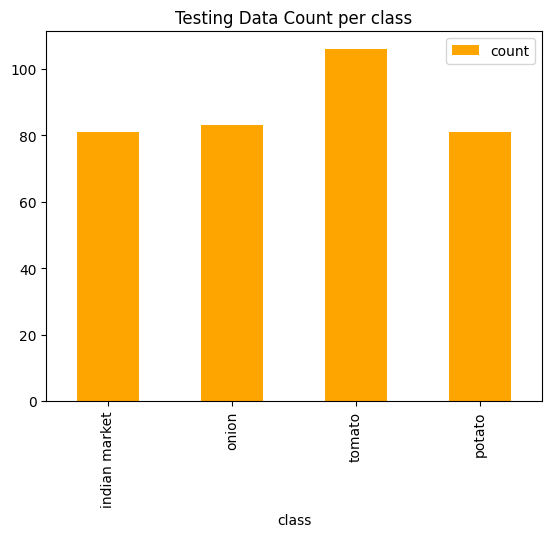

In [10]:
df_count_test.plot.bar(x='class', y='count', title="Testing Data Count per class", color='orange')

### **Loading the data using Keras utility function:**

Splitting the data into Train and Validation.

In [9]:
train_data = tf.keras.utils.image_dataset_from_directory(directory = '/content/ninjacart_data/train',
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       seed = 2022,
                                                       validation_split = 0.2,
                                                       subset = "training",
                                                       shuffle=True)

val_data = tf.keras.utils.image_dataset_from_directory(directory = '/content/ninjacart_data/train',
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       seed = 2022,
                                                       validation_split = 0.2,
                                                       subset = "validation",
                                                       shuffle=True)

test_data = tf.keras.utils.image_dataset_from_directory(directory = '/content/ninjacart_data/test',
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       seed = 2022)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Found 3135 files belonging to 4 classes.
Using 627 files for validation.
Found 351 files belonging to 4 classes.


### **Resizing and Rescaling the Data:**

In [10]:
height, width = 256, 256 # Optional, not required if we already have resized the data from `image_dataset_from_directory` function.

# Data Processing Stage with resizing and rescaling operations
data_preprocess = Sequential(
    name = "data_preprocess",
    layers = [
        layers.Resizing(height, width),
        #layers.Rescaling(1./255),
        ]
    )

train_ds = train_data.map(lambda x, y: (data_preprocess(x), y))
val_ds = val_data.map(lambda x, y: (data_preprocess(x), y))
test_ds = test_data.map(lambda x, y: (data_preprocess(x), y))

## **Building Custom CNN Model:**

In [ ]:
# Creating Model Architecture

model_1 = tf.keras.Sequential([

tf.keras.layers.InputLayer(input_shape = (height, width, 3)),

layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
layers.MaxPool2D(pool_size = (2,2)),

layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
layers.MaxPool2D(pool_size = (2,2)),

layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),

layers.GlobalAveragePooling2D(),
layers.Dense(4, activation = 'softmax')
])

In [ ]:
## Compiling the model

model_1.compile(optimizer = 'adam',
                loss = 'categorical_crossentropy',
                metrics = ['accuracy'])

In [ ]:
log_dir_1 = "logs/Custom_CNN_overfit"
tensorboard_cb = callbacks.TensorBoard(log_dir=log_dir_1, histogram_freq=1)

### **Model Training:**

In [ ]:
history_1 = model_1.fit(train_ds, epochs=10, validation_data=val_ds, callbacks=[tensorboard_cb])

Epoch 1/10
79/79 [==============================] - 1065s 13s/step - loss: 1.0519 - accuracy: 0.5175 - val_loss: 0.7156 - val_accuracy: 0.7193
Epoch 2/10
79/79 [==============================] - 1044s 13s/step - loss: 0.6952 - accuracy: 0.7356 - val_loss: 0.5996 - val_accuracy: 0.7671
Epoch 3/10
79/79 [==============================] - 1040s 13s/step - loss: 0.5955 - accuracy: 0.7747 - val_loss: 0.5698 - val_accuracy: 0.7815
Epoch 4/10
79/79 [==============================] - 1026s 13s/step - loss: 0.5745 - accuracy: 0.7727 - val_loss: 0.5805 - val_accuracy: 0.7608
Epoch 5/10
79/79 [==============================] - 1036s 13s/step - loss: 0.5496 - accuracy: 0.7839 - val_loss: 0.6823 - val_accuracy: 0.7448
Epoch 6/10
79/79 [==============================] - 1033s 13s/step - loss: 0.5116 - accuracy: 0.8086 - val_loss: 0.6107 - val_accuracy: 0.7480
Epoch 7/10
79/79 [==============================] - 1025s 13s/step - loss: 0.4903 - accuracy: 0.8054 - val_loss: 0.5910 - val_accuracy: 0.7831

In [4]:
# Function for plotting model accuracy and loss on train and validation dataset

def plot_acc_loss(model_history, n_epochs):

  fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
  ax = axes.ravel()

  #accuracy graph
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['accuracy']], label='Train', color='b')
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['val_accuracy']], label='Val', color='r')
  ax[0].set_title('Accuracy vs. epoch', fontsize=15)
  ax[0].set_ylabel('Accuracy', fontsize=15)
  ax[0].set_xlabel('epoch', fontsize=15)
  ax[0].legend()

  #loss graph
  ax[1].plot(range(0, n_epochs), model_history.history['loss'], label='Train', color='b')
  ax[1].plot(range(0, n_epochs), model_history.history['val_loss'], label='Val', color='r')
  ax[1].set_title('Loss vs. epoch', fontsize=15)
  ax[1].set_ylabel('Loss', fontsize=15)
  ax[1].set_xlabel('epoch', fontsize=15)
  ax[1].legend()

  plt.show()

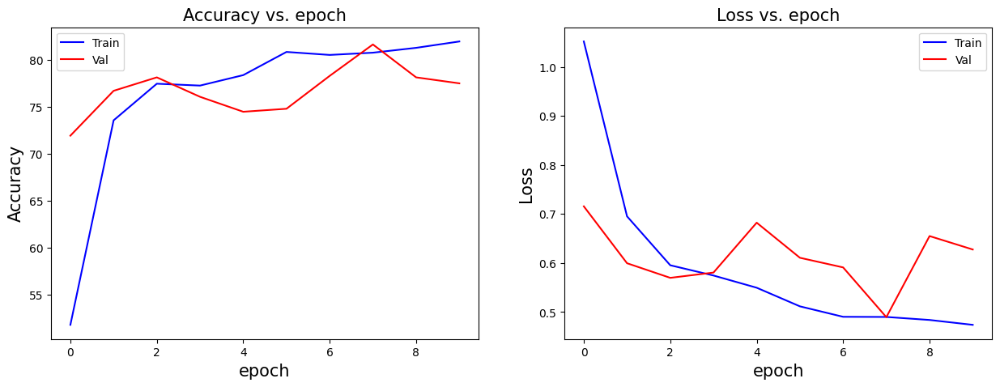

In [ ]:
plot_acc_loss(history_1, 10)

Lets try to plot the confusion matrix for the classes predictions on test data.

In [5]:
indian_market_path = '/content/ninjacart_data/test/indian market'
onion_path = '/content/ninjacart_data/test/onion'
potato_path = '/content/ninjacart_data/test/potato'
tomato_path = '/content/ninjacart_data/test/tomato'

In [6]:
def conf_mat(class_path, pred_list, model_name) :
    noise, tomato, potato, onion = 0, 0, 0, 0
    for i in os.listdir(class_path):

        img = tf.keras.utils.load_img(class_path + "/" + str(i))
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (128, 128))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        predicted = tf.argmax(pred, 1).numpy().item()

        if predicted == 0:
            noise+= 1
        elif predicted == 1:
            onion+= 1
        elif predicted == 2:
            potato+= 1
        else:
            tomato+= 1


    for item in noise, onion, potato, tomato :
        pred_list.append(item)

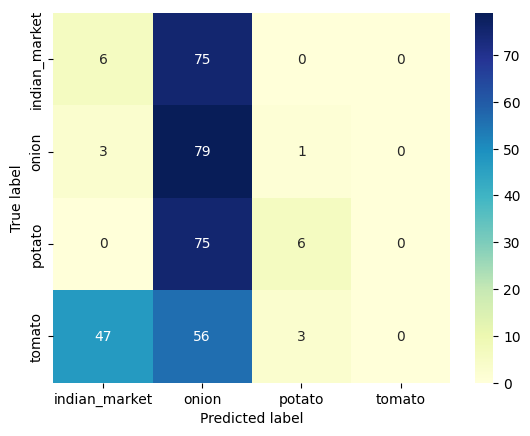

In [ ]:
class_names = ['indian_market', 'onion', 'potato', 'tomato']

noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(indian_market_path, l1, model_1)
conf_mat(onion_path, l2, model_1)
conf_mat(potato_path, l3, model_1)
conf_mat(tomato_path, l4, model_1)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True,cmap="YlGnBu", fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

Let evaluate our model on the testing data.

In [ ]:
result = model_1.evaluate(test_ds)
dict(zip(model_1.metrics_names, result))

11/11 [==============================] - 39s 3s/step - loss: 0.7459 - accuracy: 0.7123


{'loss': 0.7459335327148438, 'accuracy': 0.7122507095336914}

Seems that if we could have trained the model for more epochs it could have overfitted on the train data. Now we will try to usi techniques like augmentation, batch normalization and droupout to deal with overfitiing and generalizing the model well on the validation data.use

## **Data Augmentation:**

In [ ]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])

aug_ds = train_ds

for image, label in aug_ds :
  image = augmentation(image)

Building new model to deal with overfitting using Batch Normalization and Droupout.

## **Model Improvement using Batch Normalization and Dropout.**

In [ ]:
model_2 = tf.keras.Sequential([

tf.keras.layers.InputLayer(input_shape = (height, width, 3)),

tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),

tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),

tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.GlobalAveragePooling2D(),
tf.keras.layers.Dropout(rate = 0.2),

tf.keras.layers.Dense(4, activation = 'softmax')
])

In [ ]:
model_2.compile(optimizer = 'adam',
                loss = 'categorical_crossentropy',
                metrics = ['accuracy'])

In [ ]:
log_dir_2 = "logs/Custom_CNN_revamp"

tensorboard_cb = callbacks.TensorBoard(log_dir = log_dir_2, histogram_freq = 1)

checkpoint_cb = callbacks.ModelCheckpoint("CNN_best.h5", save_best_only = True)

early_stopping_cb = callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights = True
)

In [ ]:
history_2 = model_2.fit(train_ds, epochs=10, validation_data = val_ds, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/10
79/79 [==============================] - 1199s 15s/step - loss: 0.6092 - accuracy: 0.7564 - val_loss: 1.3742 - val_accuracy: 0.3971
Epoch 2/10
79/79 [==============================] - 1203s 15s/step - loss: 0.4782 - accuracy: 0.8138 - val_loss: 1.4816 - val_accuracy: 0.2344
Epoch 3/10
79/79 [==============================] - 1189s 15s/step - loss: 0.4141 - accuracy: 0.8329 - val_loss: 1.3578 - val_accuracy: 0.4290
Epoch 4/10
79/79 [==============================] - 1187s 15s/step - loss: 0.4085 - accuracy: 0.8353 - val_loss: 1.1356 - val_accuracy: 0.5742
Epoch 5/10
79/79 [==============================] - 1179s 15s/step - loss: 0.3888 - accuracy: 0.8445 - val_loss: 0.8098 - val_accuracy: 0.6778
Epoch 6/10
79/79 [==============================] - 1220s 15s/step - loss: 0.3391 - accuracy: 0.8656 - val_loss: 0.9574 - val_accuracy: 0.6172
Epoch 7/10
79/79 [==============================] - 1176s 15s/step - loss: 0.3404 - accuracy: 0.8668 - val_loss: 0.6469 - val_accuracy: 0.7225

Plotting the accuracy and loss across the no of epoch for our new model.

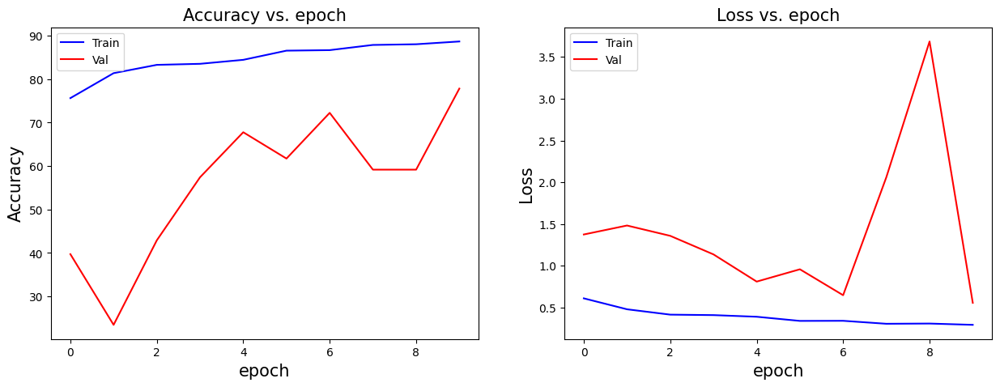

In [ ]:
plot_acc_loss(history_2, 10)

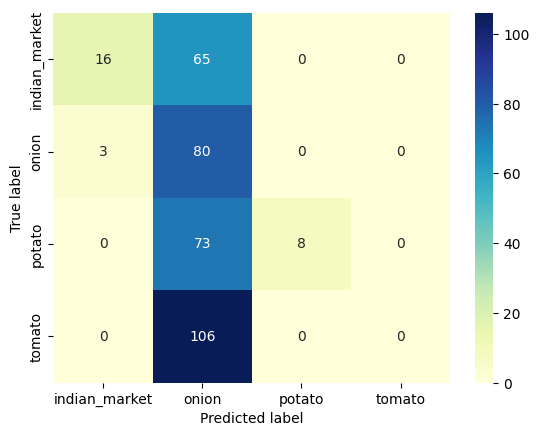

In [ ]:
class_names = ['indian_market', 'onion', 'potato', 'tomato']

noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(indian_market_path, l1, model_2)
conf_mat(onion_path, l2, model_2)
conf_mat(potato_path, l3, model_2)
conf_mat(tomato_path, l4, model_2)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True,cmap="YlGnBu", fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

From the above plot it looks like the custom model is not working out for our problem statement. It would be a good idea to use pretrained models using the transfer learning technique.

In [ ]:
result = model_2.evaluate(test_ds)
dict(zip(model_2.metrics_names, result))

11/11 [==============================] - 46s 4s/step - loss: 0.7913 - accuracy: 0.6952


{'loss': 0.7912737727165222, 'accuracy': 0.6951566934585571}

Here we can see above that the test accuracy is also very low meaning that the model is overfitted on onion class features even after using the batch normalization and droupout techniques.

## **Transfer Learning:**

**The models we will be using will be:**

*   VGG-19
*   ResNet
*   MobileNet

In [7]:
image_size = (128, 128)

train_ds = tf.keras.utils.image_dataset_from_directory(directory = '/content/ninjacart_data/train',
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       image_size = image_size,
                                                       seed = 2022,
                                                       validation_split = 0.2,
                                                       subset = "training",
                                                       shuffle=True)

val_ds = tf.keras.utils.image_dataset_from_directory(directory = '/content/ninjacart_data/train',
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       image_size = image_size,
                                                       seed = 2022,
                                                       validation_split = 0.2,
                                                       subset = "validation")

test_ds = tf.keras.utils.image_dataset_from_directory(directory = '/content/ninjacart_data/test',
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       image_size = image_size,
                                                       seed = 2022,
                                                      )

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Found 3135 files belonging to 4 classes.
Using 627 files for validation.
Found 351 files belonging to 4 classes.


## **VGG-19**

In [15]:
# Loading the VGG model using the keras applications api

pretrained_vgg = tf.keras.applications.VGG19(include_top = False, weights = 'imagenet', input_shape = (128, 128, 3))
pretrained_vgg.trainable = False

80134624/80134624 [==============================] - 0s 0us/step


In [16]:
# append classification layer
model_3 = pretrained_vgg.output

model_3 = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255),
            pretrained_vgg,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

In [17]:
model_3.compile(optimizer = 'adam',
                loss = 'categorical_crossentropy',
                metrics = ['accuracy'])

In [18]:
log_dir_5 = "logs/VGG19"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_5, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("VGG19", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [19]:
history_3 = model_3.fit(train_ds, validation_data = val_ds, epochs = 10, batch_size=32, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/10
79/79 [==============================] - 718s 9s/step - loss: 1.0837 - accuracy: 0.5841 - val_loss: 0.8679 - val_accuracy: 0.7097
Epoch 2/10
79/79 [==============================] - 780s 10s/step - loss: 0.7637 - accuracy: 0.7636 - val_loss: 0.6985 - val_accuracy: 0.7544
Epoch 3/10
79/79 [==============================] - 717s 9s/step - loss: 0.6390 - accuracy: 0.7895 - val_loss: 0.6179 - val_accuracy: 0.7831
Epoch 4/10
79/79 [==============================] - 715s 9s/step - loss: 0.5639 - accuracy: 0.8062 - val_loss: 0.5707 - val_accuracy: 0.7879
Epoch 5/10
79/79 [==============================] - 716s 9s/step - loss: 0.5202 - accuracy: 0.8278 - val_loss: 0.5331 - val_accuracy: 0.8054
Epoch 6/10
79/79 [==============================] - 713s 9s/step - loss: 0.4865 - accuracy: 0.8381 - val_loss: 0.5123 - val_accuracy: 0.8166
Epoch 7/10
79/79 [==============================] - 714s 9s/step - loss: 0.4562 - accuracy: 0.8417 - val_loss: 0.4911 - val_accuracy: 0.8134
Epoch 8/10
7

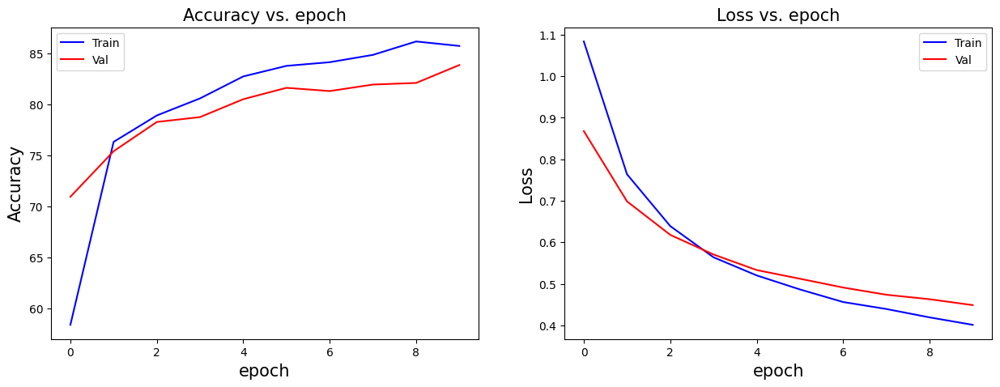

In [20]:
plot_acc_loss(history_3, 10)

From the above plots we can see that using the VGG-19 pretrained model is giving good results, still there is a scope for improvement as we have only trained the model for 10 epochs due to shortage of compute resources the model is still slightly underfitted.

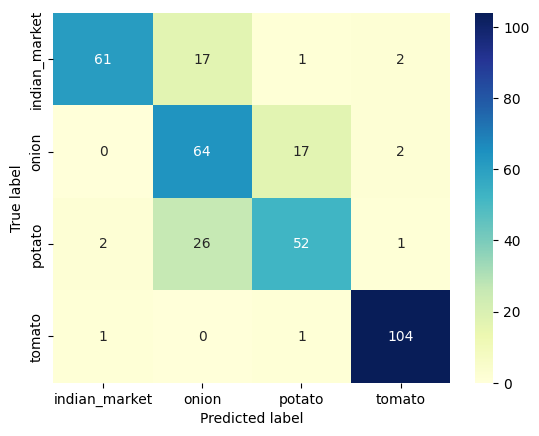

In [23]:
class_names = ['indian_market', 'onion', 'potato', 'tomato']

noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(indian_market_path, l1, model_3)
conf_mat(onion_path, l2, model_3)
conf_mat(potato_path, l3, model_3)
conf_mat(tomato_path, l4, model_3)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True,cmap="YlGnBu", fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [24]:
result = model_3.evaluate(test_ds)
dict(zip(model_3.metrics_names, result))

11/11 [==============================] - 81s 7s/step - loss: 0.5534 - accuracy: 0.8063


{'loss': 0.5533509850502014, 'accuracy': 0.8062677979469299}

## **MobileNet:**

In [8]:
# Loading the MobileNet model using the keras applications api

pretrained_mbnet = tf.keras.applications.MobileNet(input_shape=(128, 128, 3), include_top = False)
pretrained_mbnet.trainable = False

17225924/17225924 [==============================] - 0s 0us/step


In [9]:
model_4 = pretrained_mbnet.output

model_4 = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255),
            pretrained_mbnet,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

In [10]:
model_4.compile(optimizer = 'adam',
                loss = 'categorical_crossentropy',
                metrics = ['accuracy'])

In [11]:
log_dir_4 = "logs/MobileNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_4, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("MobileNet.h5", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [12]:
history_4 = model_4.fit(train_ds, validation_data = val_ds, epochs = 10, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/10
79/79 [==============================] - 53s 629ms/step - loss: 0.6160 - accuracy: 0.7592 - val_loss: 0.2905 - val_accuracy: 0.8868
Epoch 2/10
79/79 [==============================] - 47s 584ms/step - loss: 0.1955 - accuracy: 0.9286 - val_loss: 0.2196 - val_accuracy: 0.9234
Epoch 3/10
79/79 [==============================] - 47s 585ms/step - loss: 0.1330 - accuracy: 0.9573 - val_loss: 0.1892 - val_accuracy: 0.9330
Epoch 4/10
79/79 [==============================] - 47s 591ms/step - loss: 0.1081 - accuracy: 0.9669 - val_loss: 0.1717 - val_accuracy: 0.9330
Epoch 5/10
79/79 [==============================] - 46s 576ms/step - loss: 0.0912 - accuracy: 0.9677 - val_loss: 0.1609 - val_accuracy: 0.9410
Epoch 6/10
79/79 [==============================] - 56s 706ms/step - loss: 0.0676 - accuracy: 0.9801 - val_loss: 0.1559 - val_accuracy: 0.9378
Epoch 7/10
79/79 [==============================] - 45s 569ms/step - loss: 0.0634 - accuracy: 0.9813 - val_loss: 0.1556 - val_accuracy: 0.9410

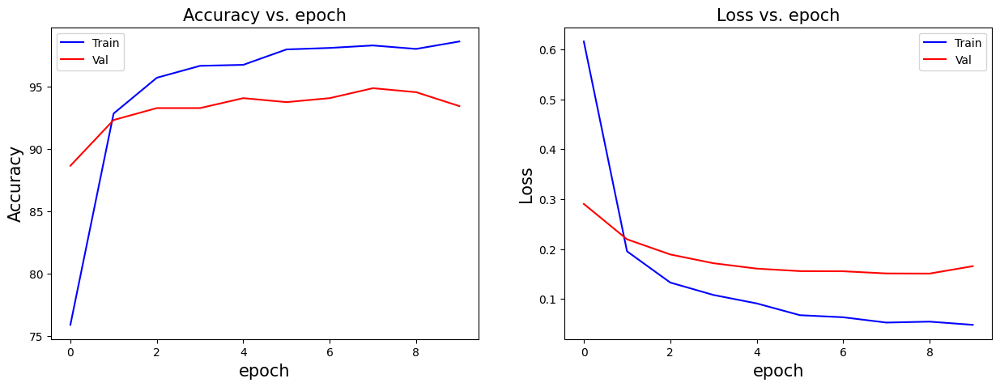

In [13]:
plot_acc_loss(history_4, 10)

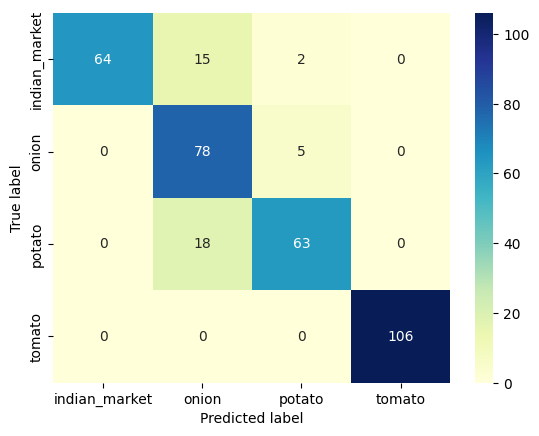

In [14]:
class_names = ['indian_market', 'onion', 'potato', 'tomato']

noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(indian_market_path, l1, model_4)
conf_mat(onion_path, l2, model_4)
conf_mat(potato_path, l3, model_4)
conf_mat(tomato_path, l4, model_4)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True,cmap="YlGnBu", fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [15]:
result = model_4.evaluate(test_ds)
dict(zip(model_4.metrics_names, result))

11/11 [==============================] - 4s 323ms/step - loss: 0.4032 - accuracy: 0.8860


{'loss': 0.4031669497489929, 'accuracy': 0.8860399127006531}

Here from the loss and accuracy plots and the confusion matrix we can say that the mobilenet model is doing a great job so far where it is performing better on both training and testing data.

## **ResNet:**

In [22]:
# load base model
pretrained_resnet = tf.keras.applications.ResNet50(input_shape=(128, 128, 3), include_top = False)

In [23]:
# append classification layer
model_5 = pretrained_resnet.output

model_5 = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255),
            tf.keras.layers.InputLayer(input_shape=(128, 128, 3)),
            pretrained_resnet,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

In [24]:
model_5.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.1),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

In [25]:
log_dir_3 = "logs/ResNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_3, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("ResNet.h5", save_best_only=True)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [ ]:
history_5 = model_5.fit(train_ds, validation_data = val_ds, batch_size=32, epochs = 20, callbacks=[tensorboard_cb, checkpoint_cb, reduce_lr, early_stopping_cb])


### **Trained Models Comparison:**

**Custom CNN**

Train Acc : 81.98 %

Test Acc : 71.22 %

----------------------------
**Improved Custom CNN**

Train Acc : 88.68 %

Test Acc : 69.51 %

----------------------------
**VGG-19**

Train Acc : 85.77 %

Test Acc : 80.62 %

---------------------------
**MobileNet**

Train Acc : 98.64 %

Test Acc : 88.60 %

--------------------------

After training all of our Models, we found MobileNet to be the most accurate model on our Dataset.

Let's visualize all of our models via tensorboard from the logs we created during training.

We observed that MobileNet gave us the highest test accuracy and our improved baseline CNN gave us the lowest accuracy.

In [27]:
%load_ext tensorboard
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

### **Testing our Best Model:**

MobileNet achieved the highest accuracy of 98.64 % among all the models we trained

Let's test our Finetuned MobileNet to predict on some random unseen data to visualize how accurate it is !

In [28]:
test_images = []

for folder in os.listdir('/content/ninjacart_data/test'):
  for image in os.listdir('/content/ninjacart_data/test' + '/' + folder):
    test_images.append(os.path.join('/content/ninjacart_data/test', folder, image))

def grid_test_model(model_name):

  fig = plt.figure(1, figsize=(17, 11))
  plt.axis('off')
  n = 0
  for i in range(8):
    n += 1

    img_0 = tf.keras.utils.load_img(random.choice(test_images))
    img_0 = tf.keras.utils.img_to_array(img_0)
    img_0 = tf.image.resize(img_0, (256, 256))
    img_1 = tf.expand_dims(img_0, axis = 0)

    pred = model_name.predict(img_1)
    predicted_label = tf.argmax(pred, 1).numpy().item()

    for item in pred :
      item = tf.round((item*100))

    plt.subplot(2, 4, n)
    plt.axis('off')
    plt.title(f'prediction : {class_names[predicted_label]}\n\n'
              f'{item[0]} % {class_names[0]}\n'
              f'{item[1]} % {class_names[1]}\n'
              f'{item[2]} % {class_names[2]}\n'
              f'{item[3]} % {class_names[3]}\n')
    plt.imshow(img_0/255)
  plt.show()

1/1 [==============================] - 0s 59ms/step


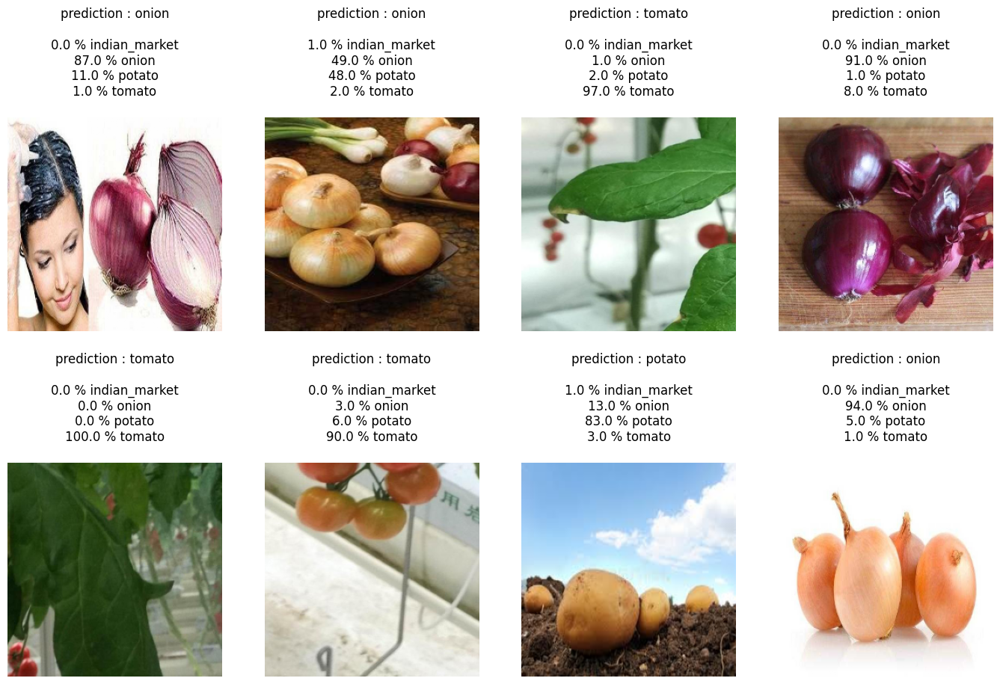

In [29]:
grid_test_model(model_4)

We can see above that our model is predicting correct class with very high confidence in almost every image. Thsi type of model is very efficient for our classifcation task.

In [33]:
result = model_4.evaluate(test_ds)
dict(zip(model_4.metrics_names, result))

11/11 [==============================] - 6s 523ms/step - loss: 0.4032 - accuracy: 0.8860


{'loss': 0.4031669497489929, 'accuracy': 0.8860399127006531}

Here we can also see that the test accuracy on the entire test data is almost 89%.